# Download Citibike Trip Data

In [1]:
import os
from os.path import join
import pandas as pd
from tqdm import tqdm
import osmnx as ox
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import requests

%matplotlib inline

In [4]:
nyc_citibike_urls = [
    "https://s3.amazonaws.com/tripdata/201601-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201602-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201603-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201604-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201605-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201606-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201607-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201608-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201609-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201610-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201611-citibike-tripdata.zip",
    "https://s3.amazonaws.com/tripdata/201612-citibike-tripdata.zip",    
    "https://s3.amazonaws.com/tripdata/201701-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201702-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201703-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201704-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201705-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201706-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201707-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201708-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201709-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201710-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201711-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201712-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201801-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201802-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201803-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201804-citibike-tripdata.csv.zip",
    "https://s3.amazonaws.com/tripdata/201805-citibike-tripdata.csv.zip"
]

# Download and read in Citibike Trip Data

In [5]:
def read_trip_data(data_urls):

    trip_data = []
    for i in tqdm(data_urls):

        df = pd.read_csv(i)

        # Delete a junk column that exists in some but not all months
        if 'name_localizedValue0' in df.columns:
            del df['name_localizedValue0']

        # Rename columns
        df.columns = ['tripduration', 'starttime', 'stoptime', 'start_station_id',
              'start_station_name', 'start_station_latitude', 'start_station_longitude', 
              'end_station_id', 'end_station_name','end_station_latitude', 'end_station_longitude',
              'bike_id', 'user_type', 'user_birth_year', 'user_gender']
        
        trip_data.append(df)
        
    return trip_data

In [ ]:
trip_data = read_trip_data(nyc_citibike_urls)

 21%|██        | 6/29 [10:42<41:01, 107.00s/it]

In [516]:
df = pd.concat(trip_data)

In [520]:
df.reset_index(inplace=True, drop=True)

In [521]:
df.shape

(35881234, 15)

In [528]:
%%time
df.starttime = pd.to_datetime(df.starttime)
df.stoptime = pd.to_datetime(df.stoptime)

CPU times: user 50min 14s, sys: 22 s, total: 50min 36s
Wall time: 50min 52s


In [529]:
df.head()

,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,user_birth_year,user_gender
0,923,2016-01-01 00:00:41,2016-01-01 00:16:04,268,Howard St & Centre St,40.719105,-73.999733,3002,South End Ave & Liberty St,40.711512,-74.015756,22285,Subscriber,1958.0,1
1,379,2016-01-01 00:00:45,2016-01-01 00:07:04,476,E 31 St & 3 Ave,40.743943,-73.979661,498,Broadway & W 32 St,40.748549,-73.988084,17827,Subscriber,1969.0,1
2,589,2016-01-01 00:00:48,2016-01-01 00:10:37,489,10 Ave & W 28 St,40.750664,-74.001768,284,Greenwich Ave & 8 Ave,40.739017,-74.002638,21997,Subscriber,1982.0,2
3,889,2016-01-01 00:01:06,2016-01-01 00:15:56,268,Howard St & Centre St,40.719105,-73.999733,3002,South End Ave & Liberty St,40.711512,-74.015756,22794,Subscriber,1961.0,2
4,1480,2016-01-01 00:01:12,2016-01-01 00:25:52,2006,Central Park S & 6 Ave,40.765909,-73.976342,2006,Central Park S & 6 Ave,40.765909,-73.976342,14562,Subscriber,1952.0,1


In [ ]:
df.to_csv("citibike_trips.csv")

# Get Citibike Station Locations

In [535]:
stations_url = "https://feeds.citibikenyc.com/stations/stations.json"
stations_response = requests.get(stations_url)
stations_json = stations_response.json()

In [536]:
station_ids = []
station_lats = []
station_lons = []
station_names = []
station_test = []
station_docks = []

for i in stations_json['stationBeanList']:
    station_ids.append(i['id'])
    station_lats.append(i['latitude'])
    station_lons.append(i['longitude'])
    station_names.append(i['stationName'])
    station_test.append(i['testStation'])
    station_docks.append(i['totalDocks'])
    
stations = pd.DataFrame()
stations['id'] = station_ids
stations['latitude'] = station_lats
stations['longitude'] = station_lons
stations['name'] = station_names
stations['test'] = station_test
stations['docks'] = station_docks

stations.sort_values(by='id', inplace=True)
stations.index=stations['id']

# Add spatial reference to dataframe
geometry = [Point(xy) for xy in zip(stations.longitude, stations.latitude)]
stations = stations.drop(['longitude', 'latitude'], axis=1)
crs = {'init': 'epsg:4326'}
stations = gpd.GeoDataFrame(stations, crs=crs, geometry=geometry)

In [537]:
stations.head()

,id,name,test,docks,geometry
id,,,,,
72,72,W 52 St & 11 Ave,False,39,POINT (-73.99392888 40.76727216)
79,79,Franklin St & W Broadway,False,33,POINT (-74.00666661 40.71911552)
82,82,St James Pl & Pearl St,False,11,POINT (-74.00016545 40.71117416)
83,83,Atlantic Ave & Fort Greene Pl,False,62,POINT (-73.97632328 40.68382604)
119,119,Park Ave & St Edwards St,False,19,POINT (-73.97803415 40.69608941)


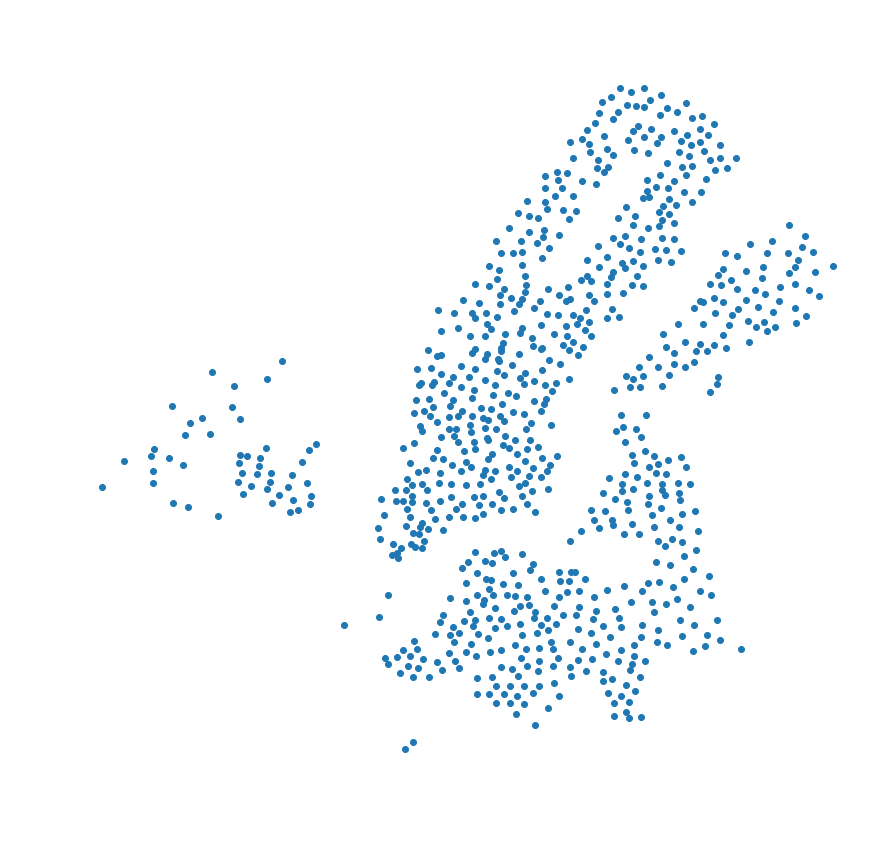

Citibike Stations


In [538]:
f, ax = plt.subplots(1, figsize=(15,15))
stations.plot(ax=ax, )
ax.set_axis_off()
plt.axis('equal')
plt.show()
print("Citibike Stations")

In [539]:
# https://github.com/geopandas/geopandas/issues/437

def gdf_bool_to_int(gdf):
    """For a given GeoDataFrame, returns a copy that
    recasts all `bool`-type columns as `int`.

    GeoDataFrame -> GeoDataFrame"""
    df = gdf.copy()
    coltypes = gpd.io.file.infer_schema(df)['properties']
    for c in coltypes.items():
        if c[1] == 'bool':
            colname = c[0]
            df[colname] = df[colname].astype('int')
    return df

In [540]:
stations = gdf_bool_to_int(stations)

In [541]:
root = ".."

output_dir = join(root, "data", "citibike_stations")

# Make data directory
if not os.path.exists(output_dir):
    os.mkdir(output_dir)

stations.to_file(output_dir)

# Convex hull around Citibike Stations

In [542]:
buffers = gpd.GeoDataFrame(stations.buffer(0.02))
buffers.columns=['geometry']
buffers['dummy']=1

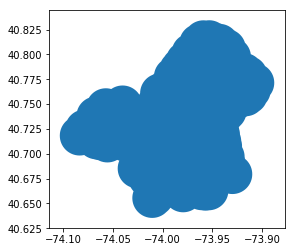

In [543]:
dissolved = buffers.dissolve(by='dummy')
dissolved.plot()

In [544]:
dissolved

,geometry
dummy,
1,POLYGON ((-73.99642742190282 40.64132197211094...


# Create grid

In [548]:
dissolved.crs = {'init':'epsg:4326'}

In [549]:
# Convert to 3857 so we can use meters as units
dissolved_3857 = dissolved.to_crs({'init':'epsg:3857'})

In [550]:
dissolved_3857

,geometry
dummy,
1,POLYGON ((-8237244.621127647 4959579.823171804...


In [917]:
dissolved_cut_4326 = ox.quadrat_cut_geometry(dissolved['geometry'].loc[1], quadrat_width=0.02)

dissolved_grid_4326 = gpd.GeoDataFrame(geometry=[dissolved_cut_4326], crs='epsg:4326')

In [918]:
dissolved_grid_4326.to_file("test")

In [563]:
dissolved_cut_3857 = ox.quadrat_cut_geometry(dissolved_3857['geometry'].loc[1], quadrat_width=2000)

dissolved_grid_3857 = gpd.GeoDataFrame(geometry=[dissolved_cut_3857], crs='epsg:3857')

# Explode grid

In [564]:
def explode(gdf):
    """ 
    Explodes a geodataframe 
    
    Will explode muti-part geometries into single geometries. Original index is
    stored in column level_0 and zero-based count of geometries per multi-
    geometry is stored in level_1
    
    Args:
        gdf (gpd.GeoDataFrame) : input geodataframe with multi-geometries
        
    Returns:
        gdf (gpd.GeoDataFrame) : exploded geodataframe with a new index 
                                 and two new columns: level_0 and level_1
        
    """
    gs = gdf.explode()
    gdf2 = gs.reset_index().rename(columns={0: 'geometry'})
    gdf_out = gdf2.merge(gdf.drop('geometry', axis=1), left_on='level_0', right_index=True)
    gdf_out = gdf_out.set_index(['level_0', 'level_1']).set_geometry('geometry')
    gdf_out.crs = gdf.crs
    gdf_out.reset_index(inplace=True, drop=True)
    gdf_out['cellId'] = gdf_out.index
    return gdf_out

In [565]:
dissolved_grid_exploded_3857 = explode(dissolved_grid_3857)

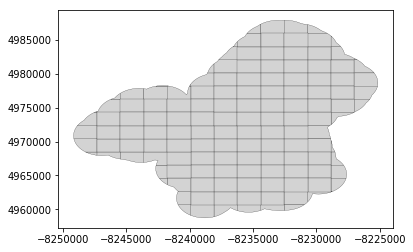

In [566]:
f, ax = plt.subplots(1)
ax = dissolved_grid_exploded_3857.plot(ax=ax, color='lightgrey', linewidth=0.2, edgecolor='black')
#ax.set_axis_off()

In [567]:
dissolved_grid_exploded_3857.head()

,geometry,cellId
0,POLYGON ((-8237244.621127647 4959579.823171804...,0
1,POLYGON ((-8238087.060621252 4958880.787021335...,1
2,POLYGON ((-8239935.784507438 4959105.552835202...,2
3,POLYGON ((-8240919.703962076 4960660.011990088...,3
4,POLYGON ((-8240925.605919522 4962608.974193566...,4


In [568]:
dissolved_grid_exploded_3857.shape

(140, 2)

# Join Stations to grid cells

In [569]:
stations_3857 = stations.to_crs({'init':'epsg:3857'})

In [572]:
dissolved_grid_exploded_3857.crs

'epsg:3857'

In [573]:
stations_joined = gpd.sjoin(stations_3857, dissolved_grid_exploded_3857, how='left', op="intersects")

In [575]:
stations_joined.head()

,id,name,test,docks,geometry,index_right,cellId
72,72,W 52 St & 11 Ave,0,39,POINT (-8236966.4847153 4978074.727920331),113,113
79,79,Franklin St & W Broadway,0,33,POINT (-8238384.44233276 4970999.131063736),74,74
82,82,St James Pl & Pearl St,0,11,POINT (-8237660.736511995 4969832.808450633),78,78
83,83,Atlantic Ave & Fort Greene Pl,0,62,POINT (-8235006.638288189 4965817.33985417),89,89
119,119,Park Ave & St Edwards St,0,19,POINT (-8235197.091465402 4967617.741565764),83,83


# Join citibike trips' station id's to cellIds

In [577]:
%%time
df_joined = pd.merge(df, stations_joined[['id', 'cellId']], how='left',
        left_on='start_station_id', right_on='id')

CPU times: user 10.1 s, sys: 14.7 s, total: 24.8 s
Wall time: 30.6 s


In [578]:
%%time
df_joined = pd.merge(df_joined, stations_joined[['id', 'cellId']], how='left',
        left_on='end_station_id', right_on='id')

CPU times: user 10.9 s, sys: 15.2 s, total: 26.1 s
Wall time: 28 s


In [579]:
stations_joined[stations_joined['id']==268]

,id,name,test,docks,geometry,index_right,cellId
268,268,Howard St & Centre St,0,27,POINT (-8237612.637586414 4970997.640276298),73,73


In [580]:
df_joined.head()

,tripduration,starttime,stoptime,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,user_birth_year,user_gender,id_x,cellId_x,id_y,cellId_y
0,923,2016-01-01 00:00:41,2016-01-01 00:16:04,268,Howard St & Centre St,40.719105,-73.999733,3002,South End Ave & Liberty St,40.711512,-74.015756,22285,Subscriber,1958.0,1,268.0,73.0,3002.0,79.0
1,379,2016-01-01 00:00:45,2016-01-01 00:07:04,476,E 31 St & 3 Ave,40.743943,-73.979661,498,Broadway & W 32 St,40.748549,-73.988084,17827,Subscriber,1969.0,1,476.0,119.0,498.0,114.0
2,589,2016-01-01 00:00:48,2016-01-01 00:10:37,489,10 Ave & W 28 St,40.750664,-74.001768,284,Greenwich Ave & 8 Ave,40.739017,-74.002638,21997,Subscriber,1982.0,2,NaN,NaN,NaN,NaN
3,889,2016-01-01 00:01:06,2016-01-01 00:15:56,268,Howard St & Centre St,40.719105,-73.999733,3002,South End Ave & Liberty St,40.711512,-74.015756,22794,Subscriber,1961.0,2,268.0,73.0,3002.0,79.0
4,1480,2016-01-01 00:01:12,2016-01-01 00:25:52,2006,Central Park S & 6 Ave,40.765909,-73.976342,2006,Central Park S & 6 Ave,40.765909,-73.976342,14562,Subscriber,1952.0,1,2006.0,118.0,2006.0,118.0


In [581]:
df_trimmed = df_joined[['starttime', 'cellId_x', 'cellId_y']]

In [582]:
df_trimmed.columns = ['starttime', 'start_cellId', 'end_cellId']

In [583]:
df_trimmed.head()

,starttime,start_cellId,end_cellId
0,2016-01-01 00:00:41,73.0,79.0
1,2016-01-01 00:00:45,119.0,114.0
2,2016-01-01 00:00:48,NaN,NaN
3,2016-01-01 00:01:06,73.0,79.0
4,2016-01-01 00:01:12,118.0,118.0


In [584]:
df_trimmed

,starttime,start_cellId,end_cellId
0,2016-01-01 00:00:41,73.0,79.0
1,2016-01-01 00:00:45,119.0,114.0
2,2016-01-01 00:00:48,NaN,NaN
3,2016-01-01 00:01:06,73.0,79.0
4,2016-01-01 00:01:12,118.0,118.0
5,2016-01-01 00:01:19,NaN,76.0
6,2016-01-01 00:01:27,117.0,117.0
7,2016-01-01 00:02:18,73.0,66.0
8,2016-01-01 00:03:12,NaN,85.0
9,2016-01-01 00:03:43,72.0,73.0


In [586]:
df_trimmed.dtypes

starttime       datetime64[ns]
start_cellId           float64
end_cellId             float64
dtype: object

In [587]:
df_trimmed.index = df_trimmed.starttime

In [591]:
df_trimmed['start_cellId'].value_counts().head(10)

66.0     3349144
114.0    2947744
73.0     2198421
118.0    2071775
119.0    2016135
67.0     1934199
79.0     1750294
113.0    1726610
72.0     1300094
117.0    1075314
Name: start_cellId, dtype: int64

In [590]:
df_trimmed.head()

,starttime,start_cellId,end_cellId
starttime,,,
2016-01-01 00:00:41,2016-01-01 00:00:41,73.0,79.0
2016-01-01 00:00:45,2016-01-01 00:00:45,119.0,114.0
2016-01-01 00:00:48,2016-01-01 00:00:48,NaN,NaN
2016-01-01 00:01:06,2016-01-01 00:01:06,73.0,79.0
2016-01-01 00:01:12,2016-01-01 00:01:12,118.0,118.0


# For each start_cellId, group by hour and count outbound trips

In [592]:
#pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 1000)

In [597]:
import numpy as np

In [1132]:
test = df_trimmed[df_trimmed['start_cellId'] == 66.0]

The below is a test

In [1133]:
test['end_cellId'].value_counts().head(10)

66.0     778214
114.0    402899
73.0     359982
67.0     338163
72.0     269383
119.0    172142
65.0     130895
79.0      95949
74.0      92911
64.0      81414
Name: end_cellId, dtype: int64

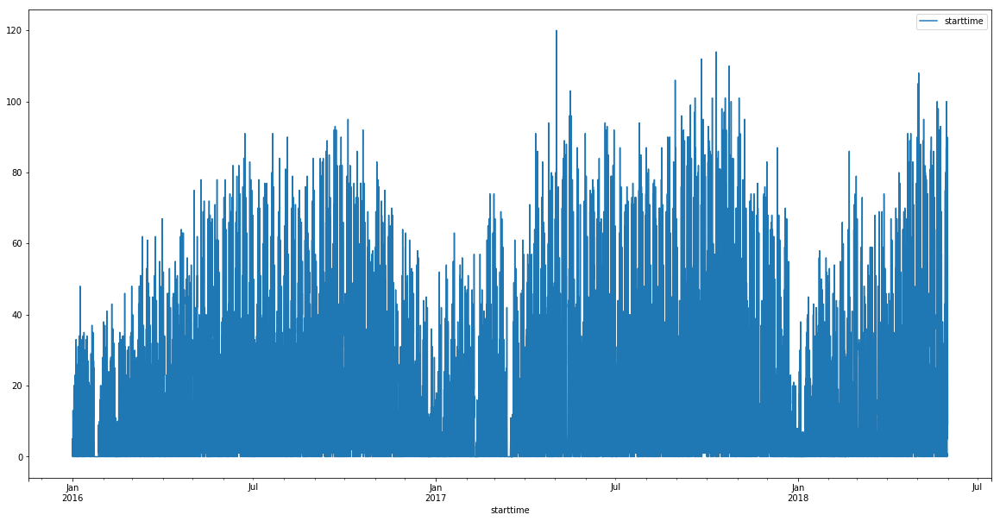

In [1134]:
data = test.groupby(by='end_cellId').resample('1H').count().loc[114.0][['starttime']]
data.plot(figsize=(20,10))
data.columns = ['trips']

In [1137]:
features = []
column_names = []

lagging_timesteps = 7 * 24
for i in range(0,lagging_timesteps+1):
    yt = data['trips']
    column_name = 'yt_{}'.format(i)
    yt_shifted = yt.shift(i)
    features.append(yt_shifted)
    column_names.append(column_name)

reframed = pd.concat(features, axis=1)
reframed.columns = column_names

reframed = reframed.dropna()


In [1138]:
reframed.head()

,yt_0,yt_1,yt_2,yt_3,yt_4,yt_5,yt_6,yt_7,yt_8,yt_9,...,yt_159,yt_160,yt_161,yt_162,yt_163,yt_164,yt_165,yt_166,yt_167,yt_168
starttime,,,,,,,,,,,,,,,,,,,,,
2016-01-08 00:00:00,4,2.0,5.0,12.0,15.0,26.0,34.0,33.0,19.0,19.0,...,4.0,5.0,0.0,0.0,0.0,2.0,3.0,3.0,2.0,5.0
2016-01-08 01:00:00,0,4.0,2.0,5.0,12.0,15.0,26.0,34.0,33.0,19.0,...,2.0,4.0,5.0,0.0,0.0,0.0,2.0,3.0,3.0,2.0
2016-01-08 02:00:00,0,0.0,4.0,2.0,5.0,12.0,15.0,26.0,34.0,33.0,...,5.0,2.0,4.0,5.0,0.0,0.0,0.0,2.0,3.0,3.0
2016-01-08 03:00:00,0,0.0,0.0,4.0,2.0,5.0,12.0,15.0,26.0,34.0,...,4.0,5.0,2.0,4.0,5.0,0.0,0.0,0.0,2.0,3.0
2016-01-08 04:00:00,0,0.0,0.0,0.0,4.0,2.0,5.0,12.0,15.0,26.0,...,9.0,4.0,5.0,2.0,4.0,5.0,0.0,0.0,0.0,2.0


In [1139]:
target_cols = "yt_0"
feature_cols = [i for i in reframed.columns if i != "yt_0"]

y = reframed[target_cols]
X = reframed[feature_cols]

In [1140]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, Normalizer

In [1141]:
# Scale the data

scaler_X = MinMaxScaler(feature_range=(0, 1))

X = np.array(X)

X = scaler_X.fit_transform(X)

scaler_y = MinMaxScaler(feature_range=(0, 1))

y = np.array(y).reshape((len(y), 1))

y = scaler_y.fit_transform(y)

/anaconda/envs/py36/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [1142]:
X.shape

(21000, 168)

In [1143]:
y.shape

(21000, 1)

In [1144]:
#n_train_periods = 48 * 30 * 20 # 24 months, every 30 mins
n_train_periods = 16 * 30 * 24 # 16 months, hourly
#n_train_periods = int(16 * 30 * 24 / 4) # 16 months, every 6 hours
#n_train_periods = 16 * 40 # 16 months, daily
#n_train_periods = 16 * 4 # 16 months, weekly
#n_train_periods = 16 # 16 months, monthly


X_train = X[0 : n_train_periods, ]
X_test = X[n_train_periods:, ]

y_train = y[0 : n_train_periods]
y_test = y[n_train_periods:]

X_train = X_train.reshape(X_train.shape + (1,))

X_test = X_test.reshape(X_test.shape + (1,))

print(X_train.shape[0], "examples")
print(X_train.shape[1], "features")
print(X_train.shape[2], "time step")


11520 examples
168 features
1 time step


In [1145]:
X_train.shape

(11520, 168, 1)

In [1146]:
X_test.shape

(9480, 168, 1)

In [1147]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Activation
from keras.callbacks import EarlyStopping

In [1148]:
import livelossplot

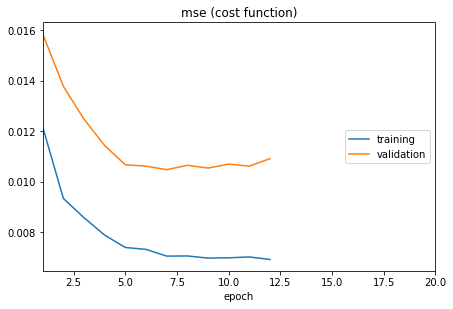

 - 54s - loss: 0.0069 - val_loss: 0.0109


In [1149]:
# THE MODEL
seed = 7

np.random.seed(seed)

plot_losses = livelossplot.PlotLossesKeras()

model = Sequential()

model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False))
model.add(Dropout(0.2))

model.add(Dense(1))

model.compile(loss='mse', optimizer='adam')

stop_here_please = EarlyStopping(patience=5)


# fit network
history = model.fit(X_train, y_train, epochs=20, batch_size=100,
                    validation_data=(X_test, y_test), verbose=2, shuffle=False,
                    callbacks=[plot_losses, stop_here_please])



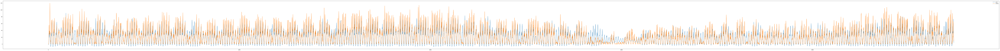

In [1150]:
yhat = model.predict(X_test)
yhat = scaler_y.inverse_transform(np.array(yhat).reshape((len(yhat), 1)))
actual = scaler_y.inverse_transform(np.array(y_test).reshape((len(y_test), 1)))

results = pd.DataFrame()
results['pred'] = yhat[:,0]
results['actual'] = actual[:,0]
results.plot(figsize=(200,10))
#results.index = list(reframed.index)[n_train_periods:]
#plt.xticks(results.index);

In [1151]:
results.shape

(9480, 2)

In [1152]:
X_test.shape

(9480, 168, 1)

In [1153]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [1154]:
# calculate r2
print("R2:  ", r2_score(results['actual'], results['pred']))

R2:   0.6601303940793397


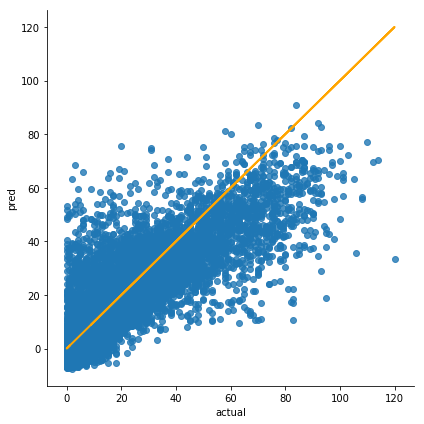

In [1155]:
import seaborn as sns
sns.lmplot(x='actual',y='pred',data=results,fit_reg=False, size=6)
plt.plot(results['actual'], results['actual'], color="orange", linewidth=2)
plt.tight_layout()

In [1156]:
results.shape

(9480, 2)

In [1157]:
X_test.shape

(9480, 168, 1)

In [1158]:
n_train_periods

11520

In [1159]:
X_test_df = reframed.reset_index()
results.set_index(X_test_df.loc[n_train_periods:]['starttime'].values, inplace=True)

In [1160]:
results

,pred,actual
2017-05-02 00:00:00,-2.072867,1.0
2017-05-02 01:00:00,-1.822116,1.0
2017-05-02 02:00:00,-1.873076,1.0
2017-05-02 03:00:00,-1.445720,0.0
2017-05-02 04:00:00,-0.306466,0.0
2017-05-02 05:00:00,1.780701,4.0
2017-05-02 06:00:00,5.991864,10.0
2017-05-02 07:00:00,13.989332,18.0
2017-05-02 08:00:00,29.793238,53.0
2017-05-02 09:00:00,32.818680,56.0


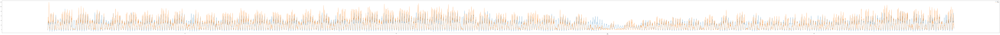

In [1164]:
yhat = model.predict(X_test)
yhat = scaler_y.inverse_transform(np.array(yhat).reshape((len(yhat), 1)))
actual = scaler_y.inverse_transform(np.array(y_test).reshape((len(y_test), 1)))

results = pd.DataFrame()
results['pred'] = yhat[:,0]
results['actual'] = actual[:,0]
results.set_index(X_test_df.loc[n_train_periods:]['starttime'].values, inplace=True)
results.plot(figsize=(300,10))
#results.index = list(reframed.index)[n_train_periods:]
#plt.xticks(results.index, rotation=90);

In [1162]:
results['diff'] = results['actual'] - results['pred']

In [1163]:
results.sort_values(by='diff', ascending=False)

,pred,actual,diff
2017-05-02 17:00:00,33.350800,120.0,86.649200
2018-05-02 09:00:00,18.970388,95.0,76.029612
2018-04-23 09:00:00,10.488079,83.0,72.511921
2017-08-30 08:00:00,35.535591,106.0,70.464409
2018-05-02 08:00:00,16.859137,83.0,66.140863
2018-05-24 08:00:00,18.456177,83.0,64.543823
2017-09-11 08:00:00,17.516430,82.0,64.483570
2017-05-02 18:00:00,28.944859,93.0,64.055141
2017-11-30 17:00:00,22.196413,83.0,60.803587
2017-11-30 08:00:00,10.896797,71.0,60.103203


# Now, do this for every start cell -> end cell combo!

In [1173]:
df_trimmed.head()

,starttime,start_cellId,end_cellId
starttime,,,
2016-01-01 00:00:41,2016-01-01 00:00:41,73.0,79.0
2016-01-01 00:00:45,2016-01-01 00:00:45,119.0,114.0
2016-01-01 00:00:48,2016-01-01 00:00:48,NaN,NaN
2016-01-01 00:01:06,2016-01-01 00:01:06,73.0,79.0
2016-01-01 00:01:12,2016-01-01 00:01:12,118.0,118.0


In [1170]:
df_trimmed_clean = df_trimmed.dropna()

In [1181]:
from collections import defaultdict

In [1186]:
model_dict = defaultdict(dict)
results_dict = defaultdict(dict)

In [1184]:
from tqdm import tqdm

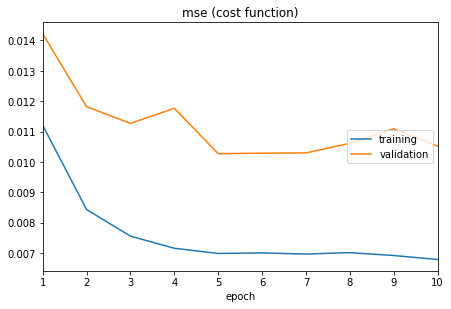

 - 64s - loss: 0.0068 - val_loss: 0.0105


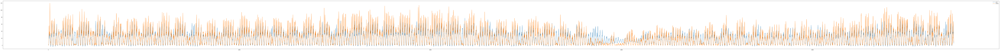

100%|██████████| 2/2 [48:51<00:00, 1465.83s/it]

R2:   0.6721294447061019


In [1194]:
for i in tqdm(df_trimmed_clean['start_cellId'].unique()[:2]):
    this_df = df_trimmed_clean[df_trimmed_clean['start_cellId'] == i]    
    
    for j in this_df['end_cellId'].unique()[:2]:
        
        this_data = this_df.groupby(by='end_cellId').resample('1H').count().loc[j][['starttime']]
        #this_data.plot(figsize=(20,10))
        this_data.columns = ['trips']
        
        features = []
        column_names = []
        lagging_timesteps = 24 * 7
        for i in range(0,lagging_timesteps+1):
            yt = data['trips']
            column_name = 'yt_{}'.format(i)
            yt_shifted = yt.shift(i)
            features.append(yt_shifted)
            column_names.append(column_name)
        reframed = pd.concat(features, axis=1)
        reframed.columns = column_names
        reframed = reframed.dropna()

        target_cols = "yt_0"
        feature_cols = [i for i in reframed.columns if i != "yt_0"]

        y = reframed[target_cols]
        X = reframed[feature_cols]
        
        # Scale the data
        scaler_X = MinMaxScaler(feature_range=(0, 1))

        X = np.array(X)

        X = scaler_X.fit_transform(X)

        scaler_y = MinMaxScaler(feature_range=(0, 1))

        y = np.array(y).reshape((len(y), 1))

        y = scaler_y.fit_transform(y)
        
        #n_train_periods = 48 * 30 * 20 # 24 months, every 30 mins
        n_train_periods = 16 * 30 * 24 # 16 months, hourly
        #n_train_periods = int(16 * 30 * 24 / 4) # 16 months, every 6 hours
        #n_train_periods = 16 * 40 # 16 months, daily
        #n_train_periods = 16 * 4 # 16 months, weekly
        #n_train_periods = 16 # 16 months, monthly


        X_train = X[0 : n_train_periods, ]
        X_test = X[n_train_periods:, ]

        y_train = y[0 : n_train_periods]
        y_test = y[n_train_periods:]

        X_train = X_train.reshape(X_train.shape + (1,))

        X_test = X_test.reshape(X_test.shape + (1,))

        print(X_train.shape[0], "examples")
        print(X_train.shape[1], "features")
        print(X_train.shape[2], "time step")

        # THE MODEL
        seed = 7

        np.random.seed(seed)

        plot_losses = livelossplot.PlotLossesKeras()

        model = Sequential()

        model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
        model.add(Dropout(0.2))

        model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False))
        model.add(Dropout(0.2))

        model.add(Dense(1))

        model.compile(loss='mse', optimizer='adam')

        stop_here_please = EarlyStopping(patience=5)


        # fit network
        history = model.fit(X_train, y_train, epochs=10, batch_size=100,
                            validation_data=(X_test, y_test), verbose=2, shuffle=False,
                            callbacks=[plot_losses, stop_here_please])

        
        model_dict[i][j] = model
        
        yhat = model.predict(X_test)
        yhat = scaler_y.inverse_transform(np.array(yhat).reshape((len(yhat), 1)))
        actual = scaler_y.inverse_transform(np.array(y_test).reshape((len(y_test), 1)))

        results = pd.DataFrame()
        results['pred'] = yhat[:,0]
        results['actual'] = actual[:,0]
        results.plot(figsize=(200,10))
        plt.show()
        #results.index = list(reframed.index)[n_train_periods:]
        #plt.xticks(results.index);
        results_dict[i][j] = results
        
        # calculate r2
        print("R2:  ", r2_score(results['actual'], results['pred']))

In [1195]:
model_dict.keys()

dict_keys([24, 168])

In [1197]:
model_dict[24][64]

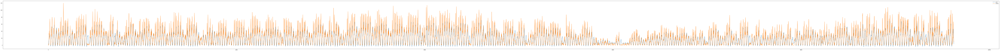

In [1203]:
results_dict[24][64].plot(figsize=(200,10))

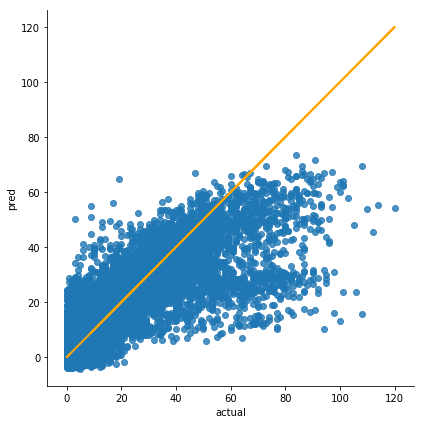

In [1202]:
sns.lmplot(x='actual',y='pred',data=results_dict[24][64],fit_reg=False, size=6)
plt.plot(results['actual'], results['actual'], color="orange", linewidth=2)
plt.tight_layout()